In [2]:
# Importing the necessary modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [5]:
# Loading and Exploring the dataset
df = pd.read_csv("insurance.csv")
df.head()

,age,sex,bmi,children,smoker,region,expenses
0,19,female,27.9,0,yes,southwest,16884.92
1,18,male,33.8,1,no,southeast,1725.55
2,28,male,33.0,3,no,southeast,4449.46
3,33,male,22.7,0,no,northwest,21984.47
4,32,male,28.9,0,no,northwest,3866.86


In [6]:
df.shape

(1338, 7)

In [7]:
# Details of Columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   expenses  1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


In [8]:
# Statical Description of Numerical Variables
df.describe()

,age,bmi,children,expenses
count,1338.000000,1338.000000,1338.000000,1338.000000
mean,39.207025,30.665471,1.094918,13270.422414
std,14.049960,6.098382,1.205493,12110.011240
min,18.000000,16.000000,0.000000,1121.870000
25%,27.000000,26.300000,0.000000,4740.287500
50%,39.000000,30.400000,1.000000,9382.030000
75%,51.000000,34.700000,2.000000,16639.915000
max,64.000000,53.100000,5.000000,63770.430000


In [9]:
# Statistical description of Categorical variables
df.describe(include=['object'])

,sex,smoker,region
count,1338,1338,1338
unique,2,2,4
top,male,no,southeast
freq,676,1064,364


# Visualizing the Data

## Distribution of Expenses

<Axes: xlabel='expenses', ylabel='Density'>

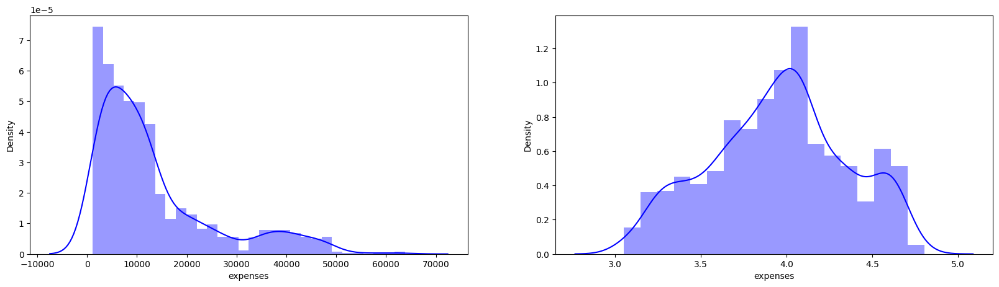

In [10]:
# Distribution of the charges
plt.figure(figsize = (20,5))
plt.subplot(1,2,1)
sns.distplot(df.expenses, color = 'b')

# Natural Log for approximately normal distribution
plt.subplot(1,2,2)
sns.distplot(np.log10(df.expenses), color = 'b')

- Note: The distribution of the expenses is skewed to the right, so we applied natural log for ~ normal distribution

## Visualizing distribution of numerical variables vs medical expenses

Text(0.5, 1.0, 'Distribution of BMI')

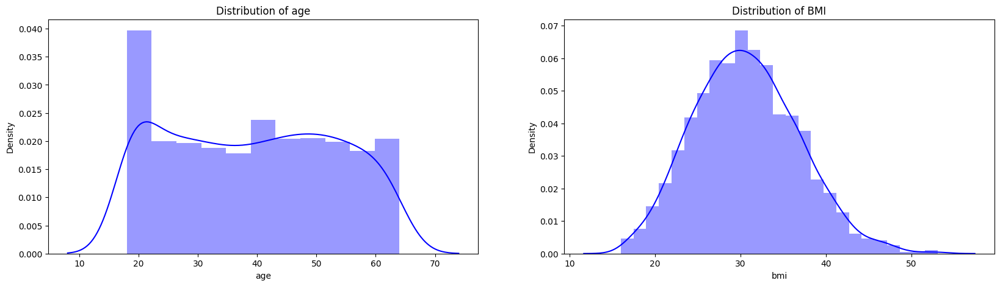

In [11]:
plt.figure(figsize = (20,5))
plt.subplot(1,2,1)
sns.distplot(df.age, color = 'b').set_title('Distribution of age')

plt.subplot(1,2,2)
sns.distplot(df.bmi, color = 'b').set_title('Distribution of BMI')

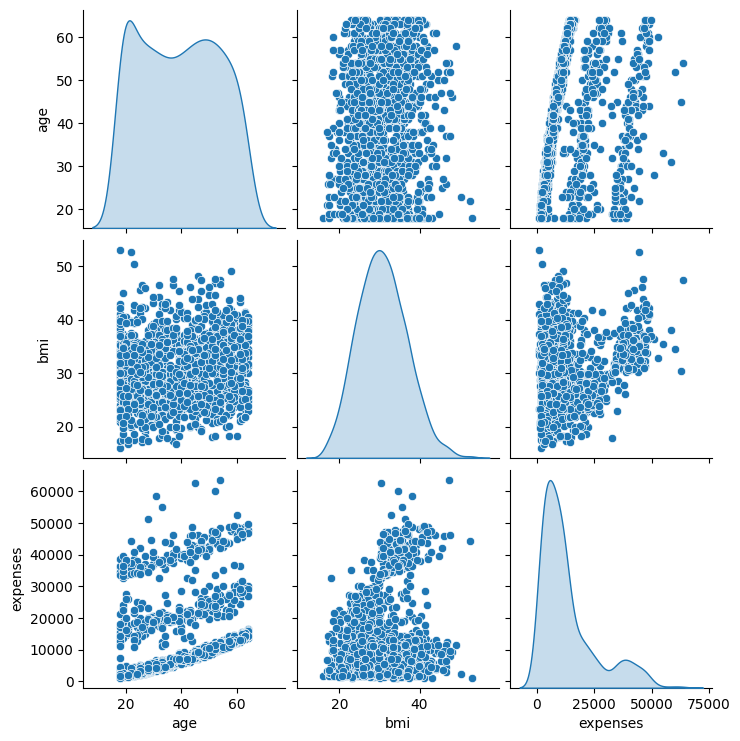

In [12]:
# Pairplot for Age, BMI, Charges
df_num = df[['age','bmi','expenses']]
sns.pairplot(df_num, diag_kind = 'kde')
plt.show()

- The pairplot reveals that there is a linear relationship between age, bmi with expenses

## Visualizing categorical variables individually vs medical Expenses

<Axes: xlabel='smoker', ylabel='expenses'>

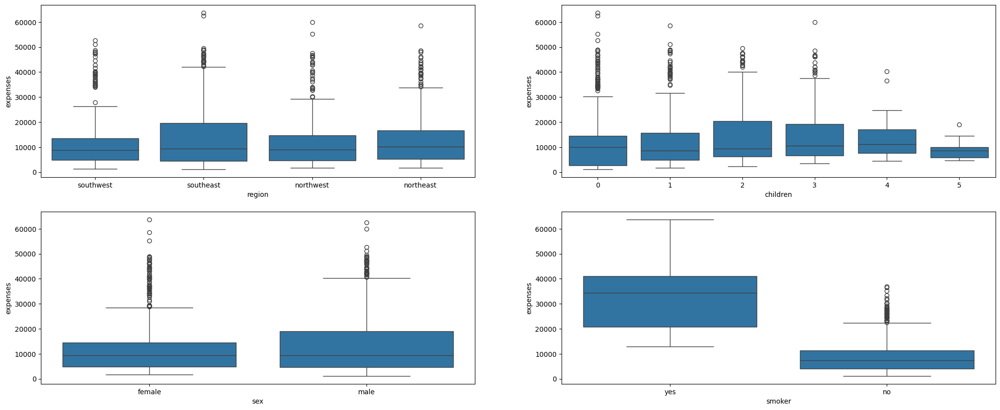

In [13]:
plt.figure (figsize = (25,10))
plt.subplot(2,2,1)
sns.boxplot(x = 'region', y = 'expenses', data = df)

plt.subplot(2,2,2)
sns.boxplot(x = 'children', y = 'expenses', data = df)

plt.subplot(2,2,3)
sns.boxplot(x = 'sex', y = 'expenses', data = df)

plt.subplot(2,2,4)
sns.boxplot(x = 'smoker', y = 'expenses', data = df)

# Bi-Variate Analysis

## Expenses by region

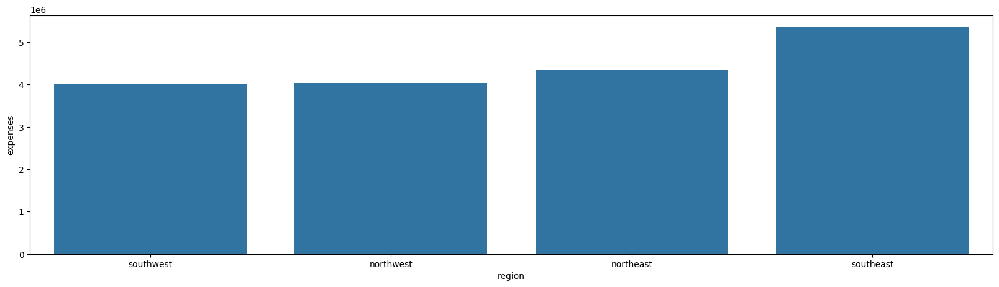

In [14]:
expenses = df['expenses'].groupby(df.region).sum().sort_values(ascending = True)
plt.figure(figsize=(20,5))
ax = sns.barplot(x = expenses.index, y = expenses)

## Expenses by region and number of children

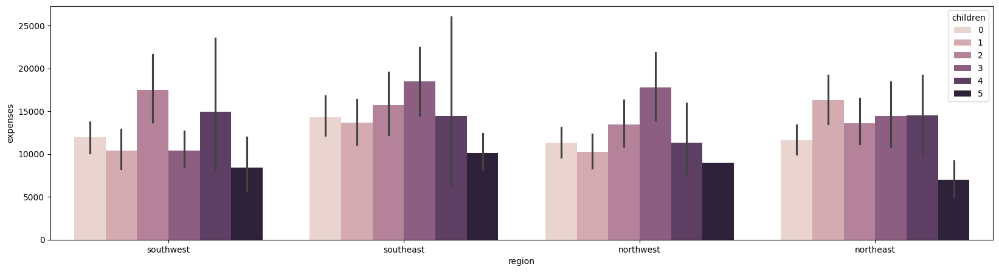

In [15]:
# Setting children as hue parameter
plt.figure(figsize=(20,5))
ax = sns.barplot(x = 'region', y = 'expenses', hue = 'children', data = df)

- It seems that there is not a statistical difference in terms of how the number of children in a particular region affects charges

<Axes: xlabel='region', ylabel='expenses'>

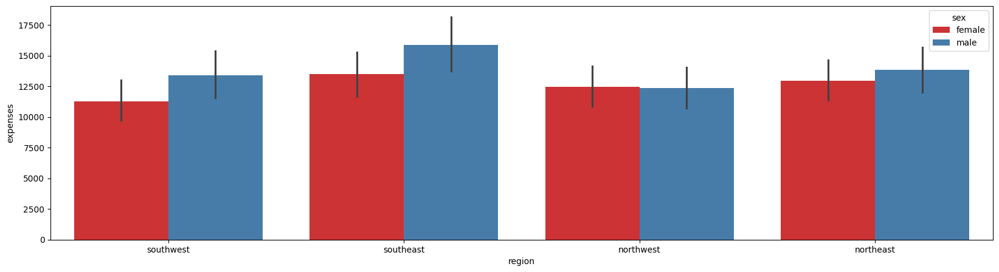

In [16]:
# setting Sex as Hue parameter
plt.figure(figsize=(20,5))
sns.barplot(x = 'region', y = 'expenses', hue = 'sex', data = df, palette = 'Set1')

- Again, similar to the previous graph, it seems that there is not a statistical difference in terms of how gender in a particular region affects charges.

## Charges by region and smoking behavior

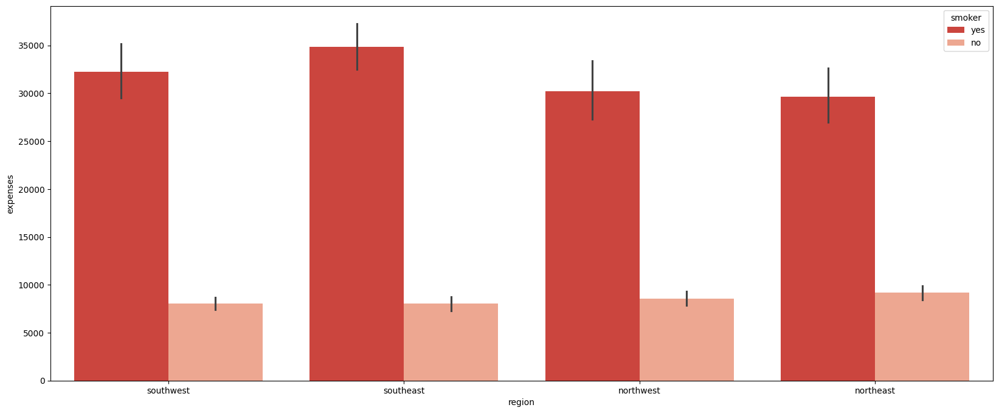

In [17]:
f, ax = plt.subplots(1, 1, figsize = (20, 8))
ax = sns.barplot(x = 'region', y = 'expenses', hue = 'smoker', data = df, palette = 'Reds_r')

## Charges by age, bmi, and children based on smoking behavior

Text(0.5, 1.0, 'Number of children vs Medical Expenses')

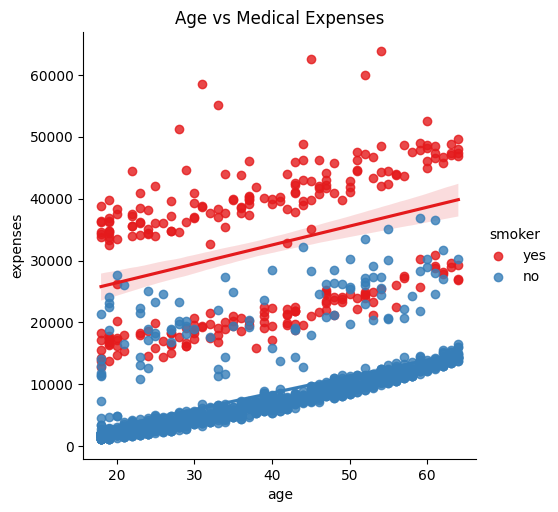

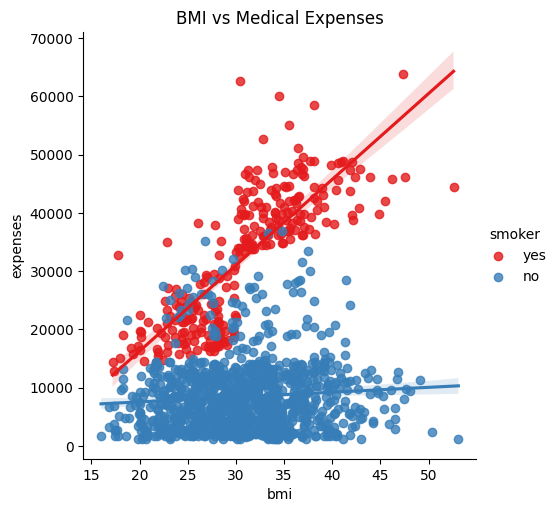

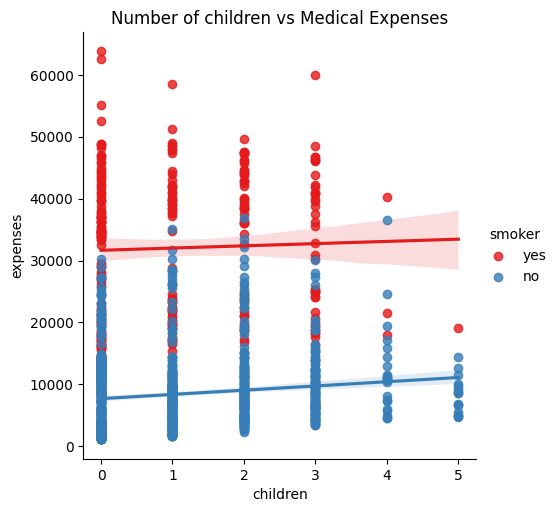

In [18]:
ax = sns.lmplot(x = 'age', y = 'expenses', data = df, hue = 'smoker', palette = 'Set1')
plt.title('Age vs Medical Expenses')

ax = sns.lmplot(x = 'bmi', y = 'expenses', data = df, hue = 'smoker', palette = 'Set1')
plt.title('BMI vs Medical Expenses')

ax = sns.lmplot(x = 'children', y = 'expenses', data = df, hue = 'smoker', palette = 'Set1')
plt.title('Number of children vs Medical Expenses')

# Data Correlation

In [19]:
# Converting data to categorical type data
df[['region','sex','smoker']] = df[['region','sex','smoker']].astype('category')
df.dtypes

age            int64
sex         category
bmi          float64
children       int64
smoker      category
region      category
expenses     float64
dtype: object

In [20]:
#Converting Data to numerical type using LabelEncoder
from sklearn.preprocessing import LabelEncoder
label = LabelEncoder()

label.fit(df.region.drop_duplicates())
df.region = label.transform(df.region)

label.fit(df.sex.drop_duplicates())
df.sex = label.transform(df.sex)

label.fit(df.smoker.drop_duplicates())
df.smoker = label.transform(df.smoker)

df.dtypes

age           int64
sex           int64
bmi         float64
children      int64
smoker        int64
region        int64
expenses    float64
dtype: object

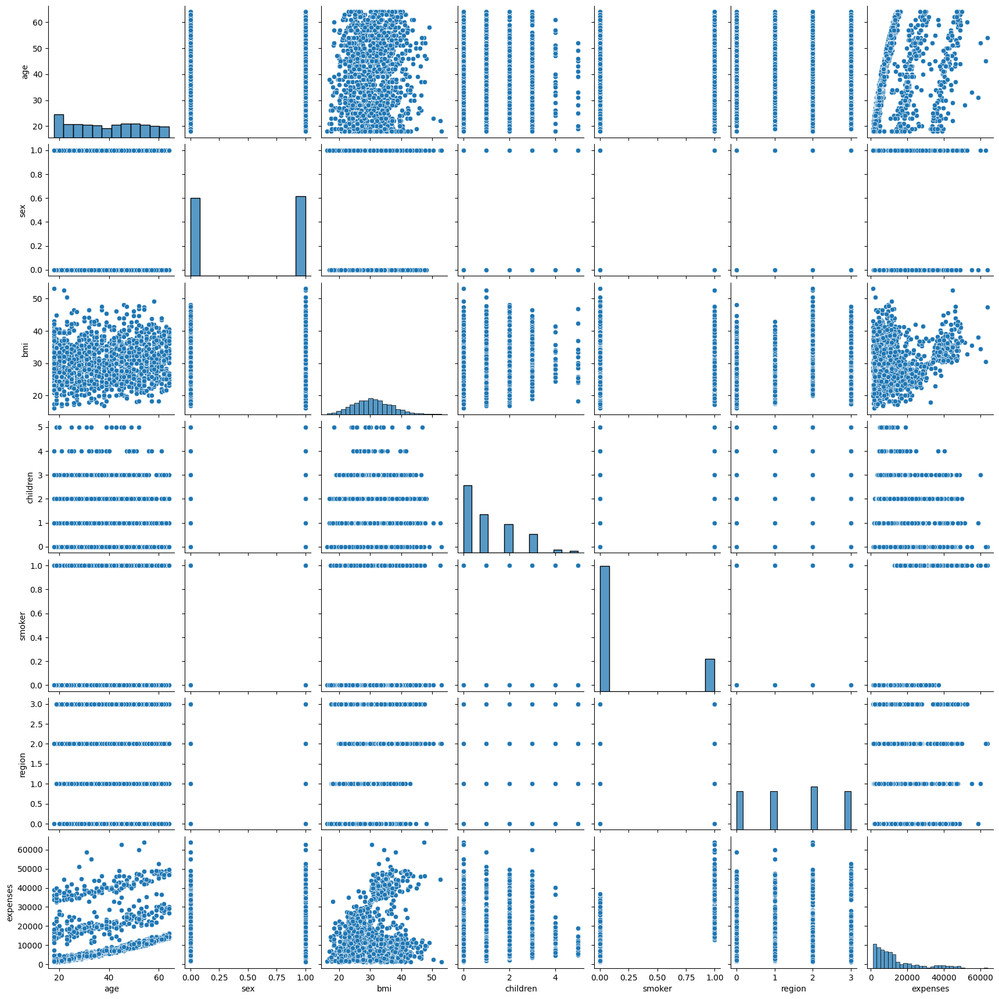

In [21]:
sns.pairplot(df)

Text(0.5, 1.0, 'Correlation Factors Heat Map')

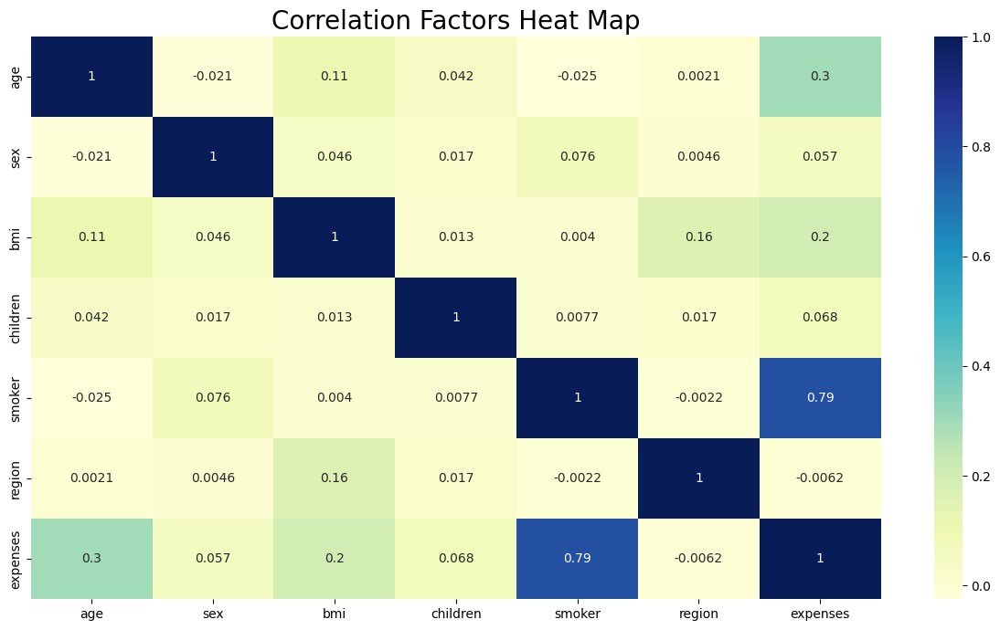

In [22]:
plt.figure(figsize=(15,8))
sns.heatmap(df.corr(), annot = True, cmap = 'YlGnBu').set_title('Correlation Factors Heat Map', size = '20')

# Model Building/ Evaluation (Preparing Data for Machine Learning)

In [23]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score

In [24]:
# Define features and target
X = df.drop("expenses", axis=1)
y = df["expenses"]

In [25]:
# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Machine Learning

In [26]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

### Model Coefficients & Intercept

In [27]:
print("Intercept:", model.intercept_)
coeff_df = pd.DataFrame(model.coef_, X.columns, columns=["Coefficient"])
coeff_df

Intercept: -11951.679263020664


,Coefficient
age,257.038298
sex,-18.704810
bmi,335.939380
children,425.463175
smoker,23646.927259
region,-271.222476


## Predict on Train and Test Data

In [28]:
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

In [29]:
y_train_pred

array([ 7170.57389951,  8292.44765696,  9236.75782118, ...,
       11403.50956212, 37233.63841959, 11397.64232883], shape=(1070,))

In [30]:
y_test_pred

array([ 8931.64285422,  7108.65837503, 36911.24588592,  9492.1867315 ,
       27005.51458817, 10792.51319722,   219.4619664 , 16940.94699877,
        1057.14434333, 11271.11976436, 28047.33508408,  9427.63503125,
        5329.25523971, 38478.07916194, 40296.31673179, 37133.86645401,
       15296.29024458, 35954.44751436,  9194.99722747, 31513.44163793,
        3798.1729981 , 10071.14543504,  2312.23330804,  7073.55061039,
       11345.29924351, 12913.60653244, 14448.42340264,  6206.0789747 ,
        9916.03458141,  2225.63567221,  9061.06174806, 13111.1535072 ,
        4627.96439893,  3483.42431425,  4402.58881377, 12966.72664374,
        1926.72036749,  8757.35074335, 33311.61922648, 32638.00629978,
        3853.56310911,  4387.19570727, 14080.89095373, 11490.10719794,
        8846.99095184, 12045.0041818 ,  5313.39203076,  3100.3272096 ,
       35556.95223675,  9206.35674505, 15893.88802705,  2415.94128125,
       12391.98367335,  1424.32310327, 13437.63031252, 12516.11125483,
      

- Made predictions for both training and test sets.
- These predicted values will be used for model evaluation next.

## Evaluate Model Performance

In [31]:
mse_train = mean_squared_error(y_train, y_train_pred)
mse_test = mean_squared_error(y_test, y_test_pred)

rmse_train = np.sqrt(mse_train)
rmse_test = np.sqrt(mse_test)

r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

print(f"MSE Train: {mse_train:.2f}, MSE Test: {mse_test:.2f}")
print(f"RMSE Train: {rmse_train:.2f}, RMSE Test: {rmse_test:.2f}")
print(f"R² Train: {r2_train:.3f}, R² Test: {r2_test:.3f}")
print(f"Model Score on Test Data: {model.score(X_test, y_test):.3f}")


MSE Train: 37277033.97, MSE Test: 33639075.09
RMSE Train: 6105.49, RMSE Test: 5799.92
R² Train: 0.742, R² Test: 0.783
Model Score on Test Data: 0.783


## Feature Importance (Bar Plot)

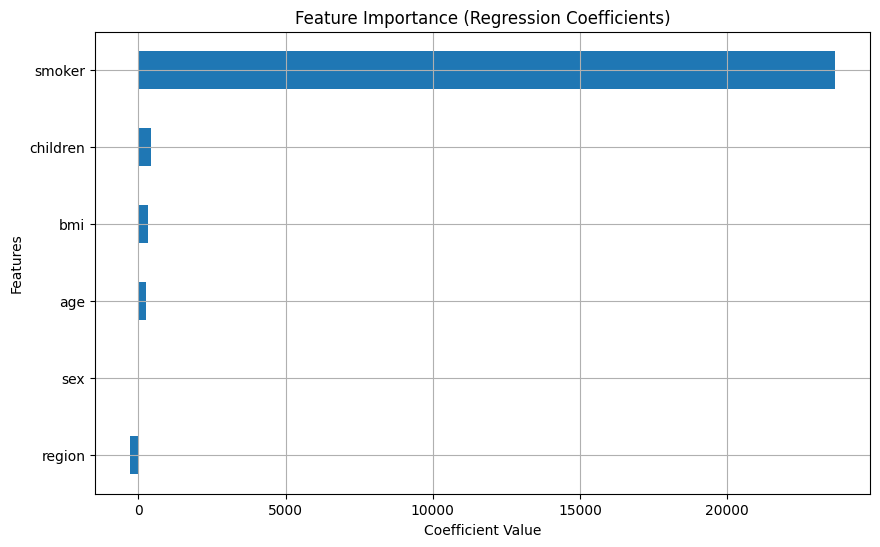

In [32]:
coeff_df.sort_values("Coefficient").plot(kind="barh", figsize=(10,6), legend=False)
plt.title("Feature Importance (Regression Coefficients)")
plt.xlabel("Coefficient Value")
plt.ylabel("Features")
plt.grid(True)
plt.show()

# Actual vs Predicted Comaprison

In [33]:
#  Predicting on the test data
y_test_pred = model.predict(X_test)

#  Creating DataFrame to compare actual vs predicted and error
comparison_df = pd.DataFrame({
    'Actual Expenses': y_test.values,
    'Predicted Expenses': y_test_pred,
    'Error (Actual - Predicted)': y_test.values - y_test_pred
})

#  Display the first 10 comparisons
comparison_df.head(10)

,Actual Expenses,Predicted Expenses,Error (Actual - Predicted)
0,9095.07,8931.642854,163.427146
1,5272.18,7108.658375,-1836.478375
2,29330.98,36911.245886,-7580.265886
3,9301.89,9492.186731,-190.296731
4,33750.29,27005.514588,6744.775412
5,4536.26,10792.513197,-6256.253197
6,2117.34,219.461966,1897.878034
7,14210.54,16940.946999,-2730.406999
8,3732.63,1057.144343,2675.485657
9,10264.44,11271.119764,-1006.679764


### Line Plot: Actual vs Predicted Expenses

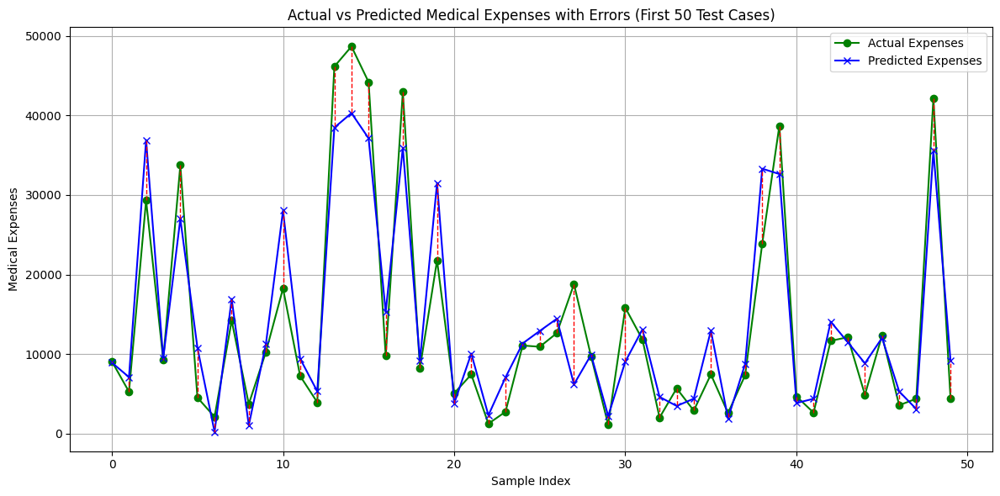

In [34]:
# Plotting Actual vs Predicted Expenses + Error lines
plt.figure(figsize=(12, 6))

# Plot actual Expenses
plt.plot(y_test.values[:50], label='Actual Expenses', marker='o', color='green')

# Plot predicted Expenses
plt.plot(y_test_pred[:50], label='Predicted Expenses', marker='x', color='blue')

# Plot vertical lines for error between actual and predicted
for i in range(50):
    plt.plot([i, i], [y_test.values[i], y_test_pred[i]], color='red', linewidth=1, linestyle='--')

plt.title("Actual vs Predicted Medical Expenses with Errors (First 50 Test Cases)")
plt.xlabel("Sample Index")
plt.ylabel("Medical Expenses")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [35]:

# -----------------------------
# Model 2: Decision Tree Regressor
# -----------------------------
from sklearn.tree import DecisionTreeRegressor

# Instantiate and train the model
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)

# Predict on the test set
dt_y_test_pred = dt_model.predict(X_test)

# Create DataFrame to compare actual vs predicted
dt_comparison_df = pd.DataFrame({
    'Actual Expenses': y_test.values,
    'Predicted Expenses (DT)': dt_y_test_pred,
    'Error (Actual - Predicted)': y_test.values - dt_y_test_pred
})

# Display first 10 comparisons
dt_comparison_df.head(10)


,Actual Expenses,Predicted Expenses (DT),Error (Actual - Predicted)
0,9095.07,7325.05,1770.02
1,5272.18,5469.01,-196.83
2,29330.98,28950.47,380.51
3,9301.89,9500.57,-198.68
4,33750.29,33732.69,17.60
5,4536.26,11326.71,-6790.45
6,2117.34,2709.24,-591.90
7,14210.54,14410.93,-200.39
8,3732.63,2680.95,1051.68
9,10264.44,11015.17,-750.73


In [36]:

# -----------------------------
# Model 3: Random Forest Regressor
# -----------------------------
from sklearn.ensemble import RandomForestRegressor

# Instantiate and train the model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predict on the test set
rf_y_test_pred = rf_model.predict(X_test)

# Create DataFrame to compare actual vs predicted
rf_comparison_df = pd.DataFrame({
    'Actual Expenses': y_test.values,
    'Predicted Expenses (RF)': rf_y_test_pred,
    'Error (Actual - Predicted)': y_test.values - rf_y_test_pred
})

# Display first 10 comparisons
rf_comparison_df.head(10)


,Actual Expenses,Predicted Expenses (RF),Error (Actual - Predicted)
0,9095.07,11688.2017,-2593.1317
1,5272.18,5271.5516,0.6284
2,29330.98,28256.2695,1074.7105
3,9301.89,10668.8689,-1366.9789
4,33750.29,34375.6740,-625.3840
5,4536.26,9108.1539,-4571.8939
6,2117.34,2101.0066,16.3334
7,14210.54,14288.6609,-78.1209
8,3732.63,6062.7981,-2330.1681
9,10264.44,10590.8432,-326.4032


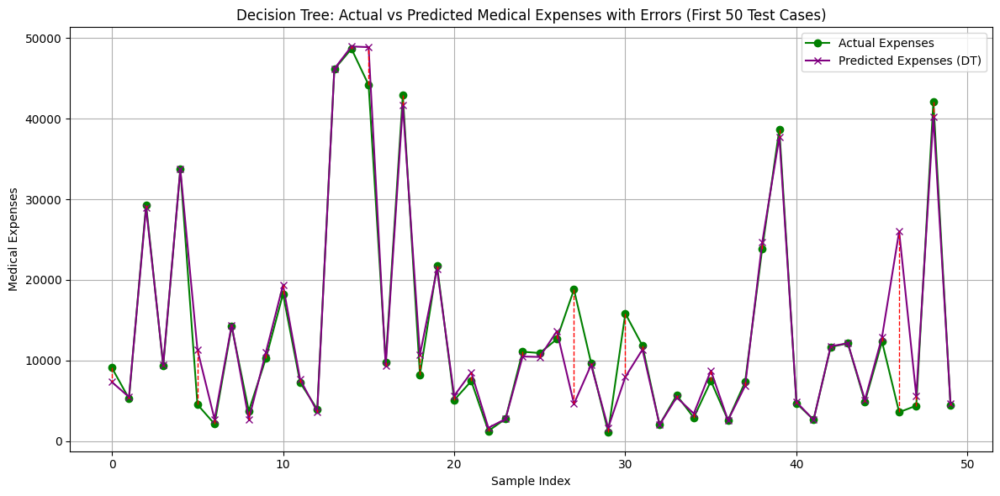

In [37]:

# Plotting Actual vs Predicted Expenses + Error lines (Decision Tree)
plt.figure(figsize=(12, 6))

# Plot actual Expenses
plt.plot(y_test.values[:50], label='Actual Expenses', marker='o', color='green')

# Plot predicted Expenses
plt.plot(dt_y_test_pred[:50], label='Predicted Expenses (DT)', marker='x', color='purple')

# Plot vertical lines for error between actual and predicted
for i in range(50):
    plt.plot([i, i], [y_test.values[i], dt_y_test_pred[i]], color='red', linewidth=1, linestyle='--')

plt.title("Decision Tree: Actual vs Predicted Medical Expenses with Errors (First 50 Test Cases)")
plt.xlabel("Sample Index")
plt.ylabel("Medical Expenses")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


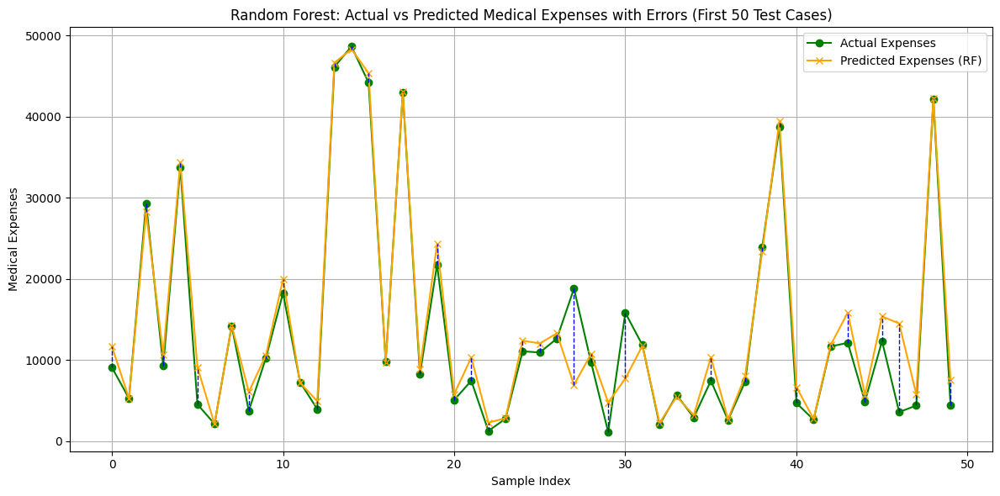

In [38]:

# Plotting Actual vs Predicted Expenses + Error lines (Random Forest)
plt.figure(figsize=(12, 6))

# Plot actual Expenses
plt.plot(y_test.values[:50], label='Actual Expenses', marker='o', color='green')

# Plot predicted Expenses
plt.plot(rf_y_test_pred[:50], label='Predicted Expenses (RF)', marker='x', color='orange')

# Plot vertical lines for error between actual and predicted
for i in range(50):
    plt.plot([i, i], [y_test.values[i], rf_y_test_pred[i]], color='blue', linewidth=1, linestyle='--')

plt.title("Random Forest: Actual vs Predicted Medical Expenses with Errors (First 50 Test Cases)")
plt.xlabel("Sample Index")
plt.ylabel("Medical Expenses")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


This graph compares the actual and predicted Expenses for the first 50 individuals.
- Green line with circles: Actual charges
- Blue line with crosses: Predicted charges
- Red dashed lines: Errors (vertical distance between actual and predicted for each person)

### Scatter Plot: Actual vs Predicted

In [39]:
import plotly.graph_objects as go
# Prepare data
actual = y_test.values
predicted = y_test_pred
error = np.abs(actual - predicted)

# Create base figure
fig = go.Figure()

# Scatter plot (actual vs predicted)
fig.add_trace(go.Scatter(
    x=actual,
    y=predicted,
    mode='markers',
    marker=dict(
        size=8,
        color=error,
        colorscale='Oranges',
        showscale=True,
        colorbar=dict(title='Error')
    ),
    hovertemplate=
        'Actual: ₹%{x:.2f}<br>' +
        'Predicted: ₹%{y:.2f}<br>' +
        'Error: ₹%{marker.color:.2f}',
    name='Predicted Points'
))

# Add perfect prediction line (diagonal)
fig.add_trace(go.Scatter(
    x=[min(actual), max(actual)],
    y=[min(actual), max(actual)],
    mode='lines',
    line=dict(color='red', dash='dash'),
    name='Perfect Prediction'
))

# Add vertical error lines (actual to predicted)
for i in range(len(actual)):
    fig.add_shape(
        type='line',
        x0=actual[i], y0=actual[i],
        x1=actual[i], y1=predicted[i],
        line=dict(color='orange', width=1, dash='dot'),
        opacity=0.4
    )

# Update layout
fig.update_layout(
    title='Interactive Scatter Plot: Actual vs Predicted Expenses with Error Lines',
    xaxis_title='Actual Expenses',
    yaxis_title='Predicted Expenses',
    width=900,
    height=600,
    hovermode='closest'
)

fig.show()

In [40]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import pandas as pd

# Evaluation function
def evaluate_model(name, y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    return {
        'Model': name,
        'MAE': round(mae, 2),
        'RMSE': round(rmse, 2),
        'R2 Score': round(r2, 4)
    }

# Evaluate all three models
linear_metrics = evaluate_model('Linear Regression', y_test, y_test_pred)
dt_metrics = evaluate_model('Decision Tree', y_test, dt_y_test_pred)
rf_metrics = evaluate_model('Random Forest', y_test, rf_y_test_pred)

# Show comparison
comparison_df = pd.DataFrame([linear_metrics, dt_metrics, rf_metrics])
comparison_df.sort_values(by="R2 Score", ascending=False)


,Model,MAE,RMSE,R2 Score
2,Random Forest,2537.90,4603.64,0.8635
0,Linear Regression,4186.94,5799.92,0.7833
1,Decision Tree,3017.33,6524.04,0.7258


## Model Evaluation Summary



To predict medical insurance expenses, we trained and evaluated three regression models:

Linear Regression

Decision Tree Regressor

Random Forest Regressor

🔎 Performance Comparison
Model	MAE (↓)	RMSE (↓)	R² Score (↑)
Random Forest	2537.90	4603.64	0.8635
Linear Regression	4186.94	5799.92	0.7833
Decision Tree	3017.33	6524.04	0.7258

#Best Performing Model: Random Forest Regressor
Reason:
The Random Forest Regressor achieved the highest R² score (0.8635) and the lowest MAE and RMSE, making it the most accurate model among the three.
It performs well because it combines multiple decision trees, reducing overfitting and improving generalization.



In [43]:
import joblib

# Assuming your model variable is named 'random_forest_model'
joblib.dump(rf_model, 'random_forest_model.pkl')

['random_forest_model.pkl']